In [1]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

In [2]:
# STG benchmark

adata_stg = sc.read_h5ad('stg_baselines.h5ad')
adata_stg

import os
from pathlib import Path
directory = Path('Benchmarking_results/STG')
for filename in directory.rglob('*.npy'):
    name = str(filename)[25:-4]
    adata_stg.obsm[name] = np.load(filename)
    
for i in range(10):
    adata_stg.obsm['GraphST'+str(i)] = sc.pp.pca(adata_stg.obsm['GraphST'+str(i)])

from simvi.model import SimVI
edge_index = SimVI.extract_edge_index(adata_stg,n_neighbors=10,batch_key='batch')
import numpy as np
from scipy.sparse import coo_matrix, csr_matrix
coo = coo_matrix((np.ones(edge_index[0].shape[0]), (edge_index[0].numpy(), edge_index[1].numpy())), shape=(adata_stg.shape[0],adata_stg.shape[0]))
for i in range(10):
    adata_stg.obsm['scviavg'+str(i)] = 0.1 * coo.toarray() @ adata_stg.obsm['scvi_'+str(i)]
    adata_stg.obsm['cellcharter'+str(i)] = np.hstack((adata_stg.obsm['scvi_'+str(i)],adata_stg.obsm['scviavg'+str(i)]))
    
s_list = ['cellcharter'+str(i) for i in range(10)]
s_list.extend(['STAGATE'+str(i) for i in range(10)])
s_list.extend(['STAGATE_harmony'+str(i) for i in range(10)])
s_list.extend(['GraphST'+str(i) for i in range(10)])
s_list.extend(['GraphST_harmony'+str(i) for i in range(10)])
s_list.extend(['spicemix'+str(i) for i in range(10)])
s_list.extend(['harmony'+str(i) for i in range(10)])
s_list.extend(['nsf_s'+str(i) for i in range(10)])
s_list.extend(['mefisto_z'+str(i) for i in range(10)])

Global seed set to 0


In [3]:
sc.pp.normalize_total(adata_stg)
sc.pp.log1p(adata_stg)
sc.pp.pca(adata_stg)

In [44]:
from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection
biocons = BioConservation(isolated_labels=False,nmi_ari_cluster_labels_leiden=True,nmi_ari_cluster_labels_kmeans=False,clisi_knn=False)
bat = BatchCorrection(ilisi_knn=False)

adata_stg_ = adata_stg[~adata_stg.obs['cluster_L1'].isin(['oENDO','oMURAL'])].copy()

bm2 = Benchmarker(
    adata_stg_,
    batch_key="batch",
    label_key="niche",
    embedding_obsm_keys=s_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm2.benchmark()

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:  10%|██████████████████▉                                                                                                                                                                          | 1/10 [00:03<00:35,  3.90s/it, Bio conservation: silhouette_label]No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:14<00:24,  4.86s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:14<00:23,  4.76s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:25<00:38,  7.68s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:25<00:36,  7.26s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

INFO     Diffusion distance failed. Skip.                                                                          
INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:23<00:34,  6.95s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

INFO     Diffusion distance failed. Skip.                                                                          
INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:24<00:35,  7.02s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

INFO     Diffusion distance failed. Skip.                                                                          
INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:24<00:36,  7.40s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:23<00:41,  8.33s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                        

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:21<00:36,  7.26s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:23<00:40,  8.13s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:13<00:22,  4.44s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:12<00:21,  4.31s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:14<00:25,  5.04s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

In [45]:
bm2._results.to_csv('Benchmarking_results/stg_niche_add.csv')

In [46]:
z_list = ['cellcharter'+str(i) for i in range(10)]
z_list.extend(['STAGATE'+str(i) for i in range(10)])
z_list.extend(['STAGATE_harmony'+str(i) for i in range(10)])
z_list.extend(['GraphST'+str(i) for i in range(10)])
z_list.extend(['GraphST_harmony'+str(i) for i in range(10)])
z_list.extend(['spicemix'+str(i) for i in range(10)])
z_list.extend(['harmony'+str(i) for i in range(10)])
z_list.extend(['nsf_s'+str(i) for i in range(10)])
z_list.extend(['mefisto_z'+str(i) for i in range(10)])

bm = Benchmarker(
    adata_stg,
    batch_key="batch",
    label_key="cluster_L1",
    embedding_obsm_keys=z_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm.benchmark()
bm._results.to_csv('Benchmarking_results/stg_ct_add.csv')

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:17<00:28,  5.74s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:15<00:25,  5.15s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:32<00:48,  9.77s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:26<00:38,  7.63s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:30<00:45,  9.05s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:16<00:27,  5.41s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:16<00:25,  5.17s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:17<00:30,  6.06s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:15<00:25,  5.06s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

In [48]:
adata_stg.X = sc.read_h5ad('stg_baselines.h5ad').X
adata_stg.obs['Myh11'] = 'Non-expressed'
adata_stg.obs['Myh11'][adata_stg[:,'MYH11'].X.flatten()>=1] = 'Expressed'

bm3 = Benchmarker(
    adata_stg,
    batch_key="cluster_L1",
    label_key="Myh11",
    embedding_obsm_keys=s_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm3.benchmark()

bm3._results.to_csv('Benchmarking_results/stg_myh11_add.csv')

/tmp/ipykernel_954101/950526952.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_stg.obs['Myh11'][adata_stg[:,'MYH11'].X.flatten()>=1] = 'Expressed'
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                             

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:21<00:53,  7.68s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:21<00:54,  7.84s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:22<00:56,  8.02s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:24<01:02,  8.89s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:24<01:02,  8.96s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:23<01:00,  8.59s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:24<01:01,  8.75s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:23<00:58,  8.42s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:22<00:55,  7.98s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                          

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                          

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:32<00:42,  8.56s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:34<00:45,  9.06s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:32<00:42,  8.54s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:14<00:23,  4.64s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:15<00:24,  4.96s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

In [7]:
meta_data = adata_stg.obs
vars_use=['batch']

import harmonypy as hm
for i in range(10):
    data_mat=adata_stg.obsm['spicemix'+str(i)]
    ho = hm.run_harmony(data_mat, meta_data,vars_use,random_state=i)
    adata_stg.obsm['spicemix_harmony'+str(i)] = ho.Z_corr.T
    np.save('Benchmarking_results/STG/'+'spicemix_harmony'+str(i)+'.npy',adata_stg.obsm['spicemix_harmony'+str(i)])

2024-03-24 17:47:05,235 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-24 17:47:09,868 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-24 17:47:09,955 - harmonypy - INFO - Iteration 1 of 10
2024-03-24 17:47:13,520 - harmonypy - INFO - Iteration 2 of 10
2024-03-24 17:47:17,139 - harmonypy - INFO - Iteration 3 of 10
2024-03-24 17:47:20,750 - harmonypy - INFO - Iteration 4 of 10
2024-03-24 17:47:24,325 - harmonypy - INFO - Iteration 5 of 10
2024-03-24 17:47:27,738 - harmonypy - INFO - Iteration 6 of 10
2024-03-24 17:47:30,272 - harmonypy - INFO - Converged after 6 iterations
2024-03-24 17:47:30,313 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-24 17:47:36,352 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-24 17:47:36,563 - harmonypy - INFO - Iteration 1 of 10
2024-03-24 17:47:40,316 - harmonypy - INFO - Iteration 2 of 10
2024-03-24 17:47:43,705 - harmonypy - INFO - Iteration 3 of 

In [8]:
from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection
biocons = BioConservation(isolated_labels=False,nmi_ari_cluster_labels_leiden=True,nmi_ari_cluster_labels_kmeans=False,clisi_knn=False)
bat = BatchCorrection(ilisi_knn=False)

adata_stg_ = adata_stg[~adata_stg.obs['cluster_L1'].isin(['oENDO','oMURAL'])].copy()

spicemix_list = ['spicemix'+str(i) for i in range(10)]
spicemix_list.extend(['spicemix_harmony'+str(i) for i in range(10)])

bm2 = Benchmarker(
    adata_stg_,
    batch_key="batch",
    label_key="niche",
    embedding_obsm_keys=spicemix_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm2.benchmark()
bm2._results.to_csv('Benchmarking_results/stg_niche_spicemix.csv')

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:  10%|█████████████████▍                                                                                                                                                            | 1/10 [00:03<00:28,  3.15s/it, Bio conservation: silhouette_label]No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:26<00:45,  9.18s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                         

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:19<00:34,  6.85s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:  50%|███████

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:23<00:41,  8.27s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:  50%|███████

Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                        

                                                                                                                                                                                                                                                               
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Embeddings: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [

In [ ]:
bm = Benchmarker(
    adata_stg,
    batch_key="batch",
    label_key="cluster_L1",
    embedding_obsm_keys=spicemix_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm.benchmark()
bm._results.to_csv('Benchmarking_results/stg_ct_spicemix.csv')

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:28<00:46,  9.25s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:  50%|██████

In [ ]:
adata_stg.X = sc.read_h5ad('stg_baselines.h5ad').X
adata_stg.obs['Myh11'] = 'Non-expressed'
adata_stg.obs['Myh11'][adata_stg[:,'MYH11'].X.flatten()>=1] = 'Expressed'

bm3 = Benchmarker(
    adata_stg,
    batch_key="cluster_L1",
    label_key="Myh11",
    embedding_obsm_keys=spicemix_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm3.benchmark()

bm3._results.to_csv('Benchmarking_results/stg_myh11_spicemix.csv')

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


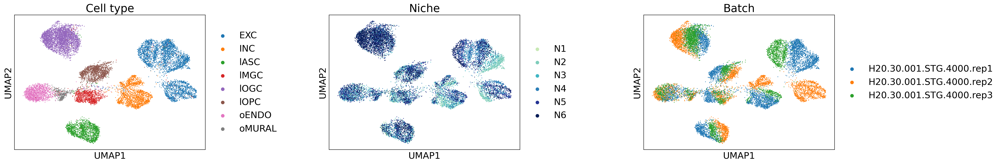

In [6]:
adata_stg = sc.read_h5ad('stg_baselines.h5ad')
sc.pp.normalize_total(adata_stg)
sc.pp.log1p(adata_stg)
sc.pp.pca(adata_stg)
sc.pp.neighbors(adata_stg,use_rep='X_pca')
sc.tl.umap(adata_stg)

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18
adata_stg.uns['niche_colors'] = ['#c7e9b4','#7fcdbb','#41b6c4','#2c7fb8','#253494','#081d58']
sc.pl.umap(adata_stg,color=['cluster_L1','niche','batch'],title=['Cell type','Niche','Batch'],wspace=0.5)

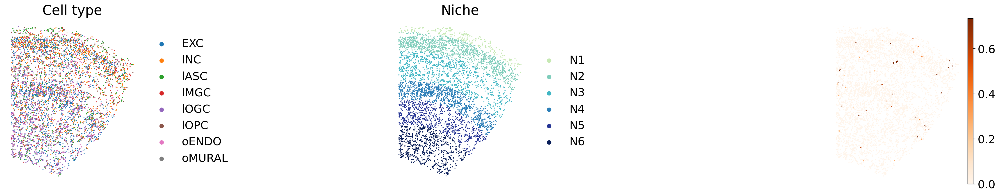

In [8]:
sc.pl.spatial(adata_stg[adata_stg.obs['batch']=='H20.30.001.STG.4000.rep1'],color=['cluster_L1','niche','MYH11'],vmax='p99.5',cmap='Oranges',spot_size=50,title=['Cell type','Niche',' '],frameon=False,wspace=0.5)

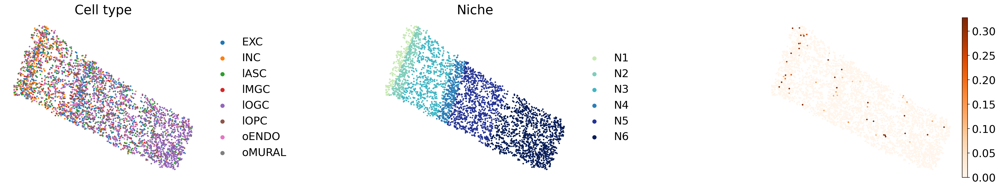

In [9]:
sc.pl.spatial(adata_stg[adata_stg.obs['batch']=='H20.30.001.STG.4000.rep2'],color=['cluster_L1','niche','MYH11'],vmax='p99.5',cmap='Oranges',spot_size=50,title=['Cell type','Niche',' '],frameon=False,wspace=0.5)

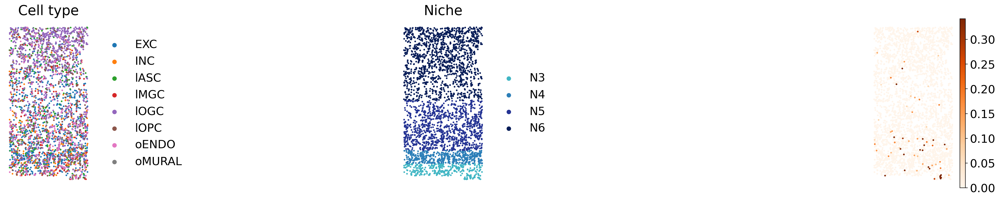

In [10]:
sc.pl.spatial(adata_stg[adata_stg.obs['batch']=='H20.30.001.STG.4000.rep3'],color=['cluster_L1','niche','MYH11'],vmax='p99.5',cmap='Oranges',spot_size=50,title=['Cell type','Niche',' '],frameon=False,wspace=0.5)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


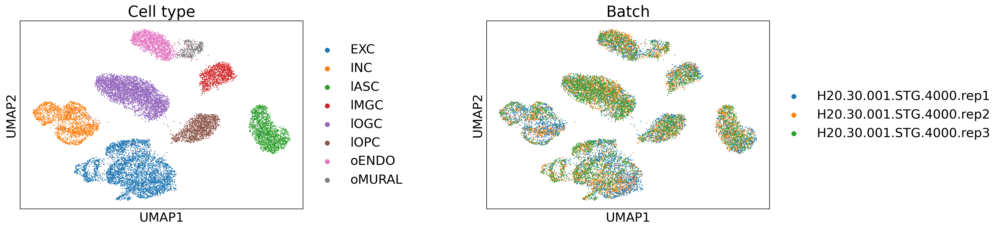

In [8]:
adata_stg = sc.read_h5ad('stg_baselines.h5ad')

sc.pp.neighbors(adata_stg,use_rep='simvikl2_z0')
sc.tl.umap(adata_stg)
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18
adata_stg.uns['niche_colors'] = ['#c7e9b4','#7fcdbb','#41b6c4','#2c7fb8','#253494','#081d58']
sc.pl.umap(adata_stg,color=['cluster_L1','batch'],title=['Cell type','Batch'],wspace=0.5)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


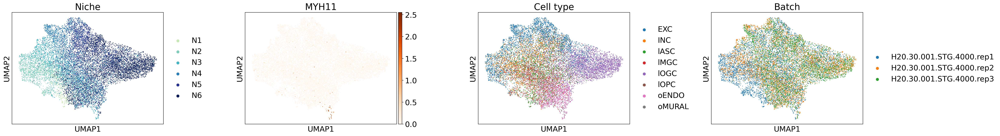

In [7]:
sc.pp.neighbors(adata_stg,use_rep='simvikl2_s0')
sc.tl.umap(adata_stg)


sc.pp.normalize_total(adata_stg)
sc.pp.log1p(adata_stg)
sc.pl.umap(adata_stg,color=['niche','MYH11','cluster_L1','batch'],title=['Niche','MYH11','Cell type','Batch'],cmap='Oranges',wspace=0.4)